In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import cv2

In [2]:
def cell_labels(seg_fn):
    # label roughly segmented cells by ilastik according to their size
    print('import segmentated figure')
    seg = cv2.imread(seg_fn, 2)

    print('get labels of each cell')
    from scipy import ndimage as ndi
    seg = ndi.binary_fill_holes(seg - 1)

    labeled, _ = ndi.label(seg)
    return seg, labeled

def save_data(img, wls, cell, seg, labeled, n_ls, save_path):
    img_data = {}

    raw = seg.copy()
    px = [np.bincount(labeled.ravel()).argsort()[::-1][int(i)] for i in n_ls]
    raw[ ~ np.isin(labeled, px)] = 2
    cell_seg = raw == 1
    img_data['segmentation'] = cell_seg
    
    img = img.astype(np.uint16)
    for i, wl in enumerate(wls):
        img_data['wls_{}_{}'.format(str(wl[0]), str(wl[1]))] = img[i].T

    np.savez_compressed(save_path + cell + '.npz', **img_data)

import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell


<ipython-input-145-320c343fd9dc>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(3, 3, figsize=[9, 9], sharex=True, sharey=True)


import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell
import segmentated figure
get labels of each cell


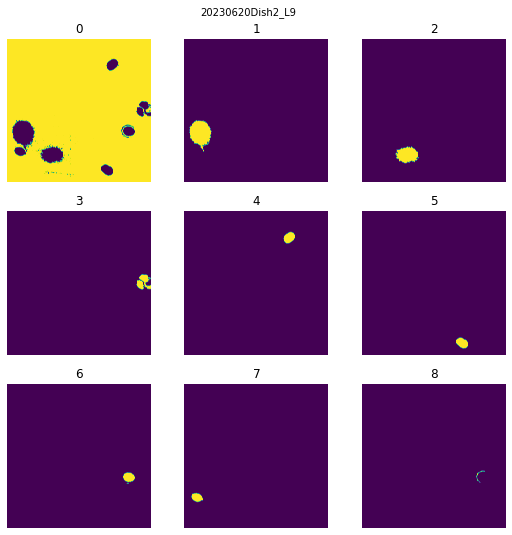

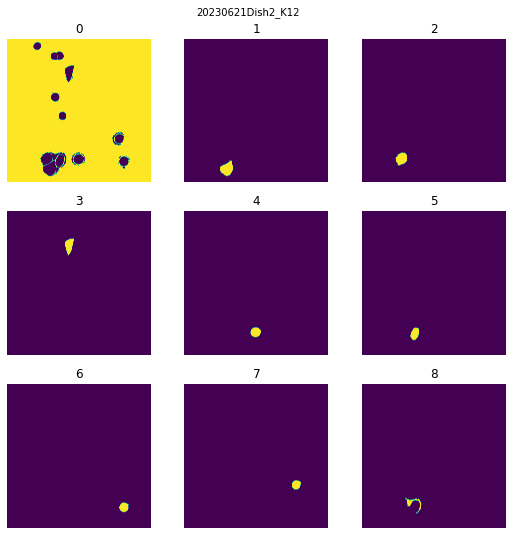

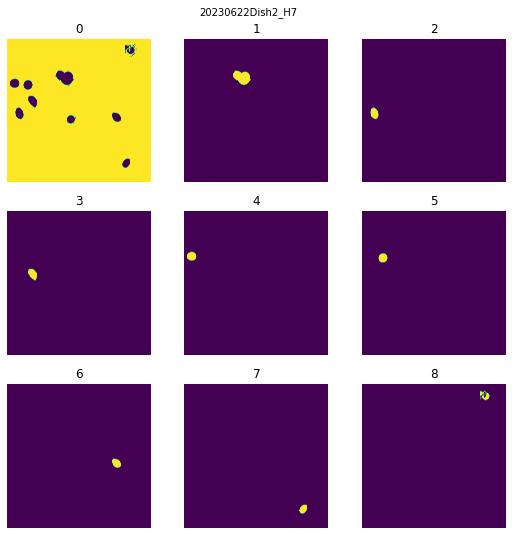

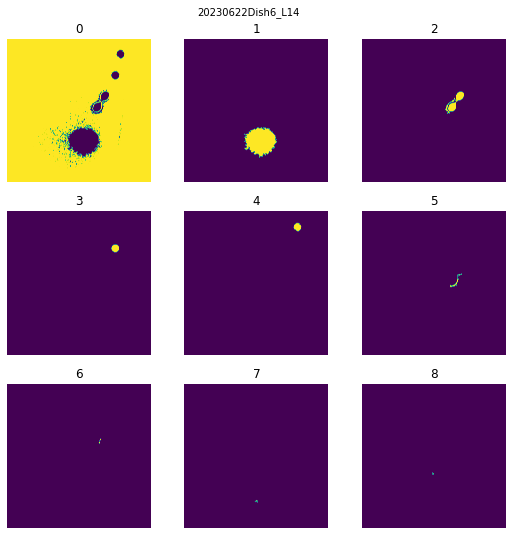

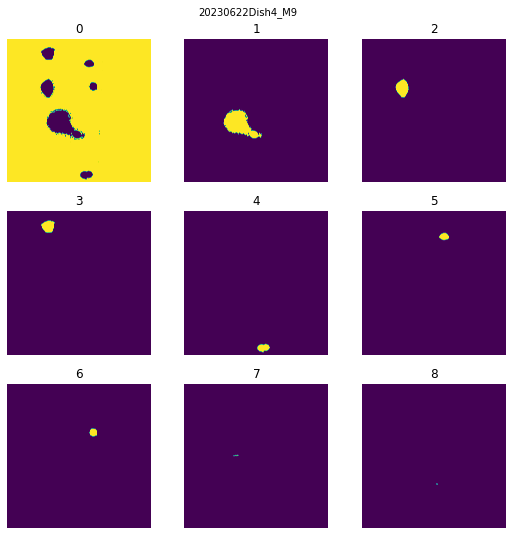

...

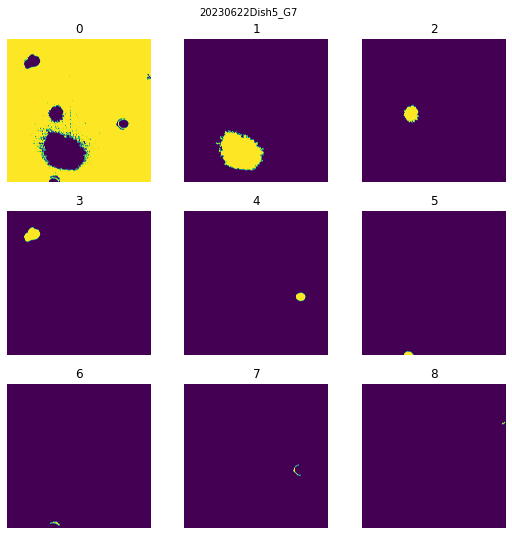

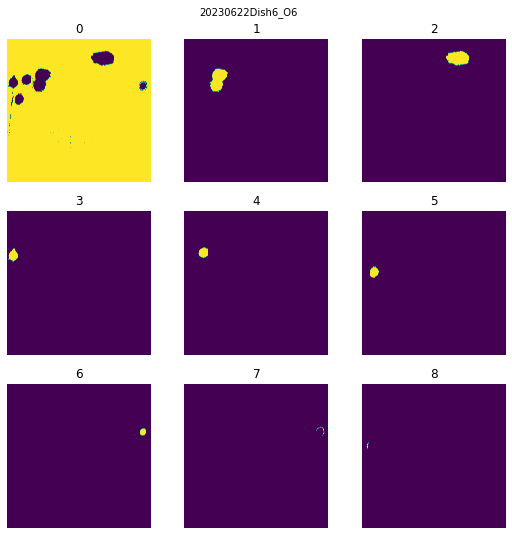

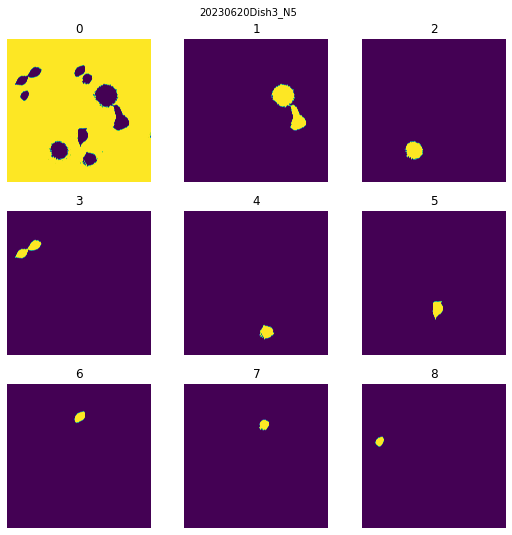

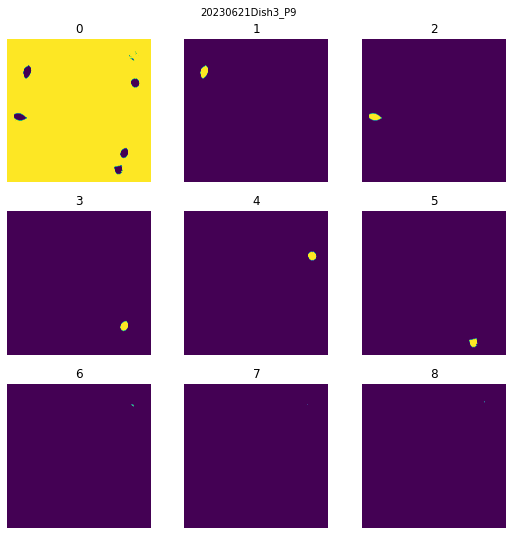

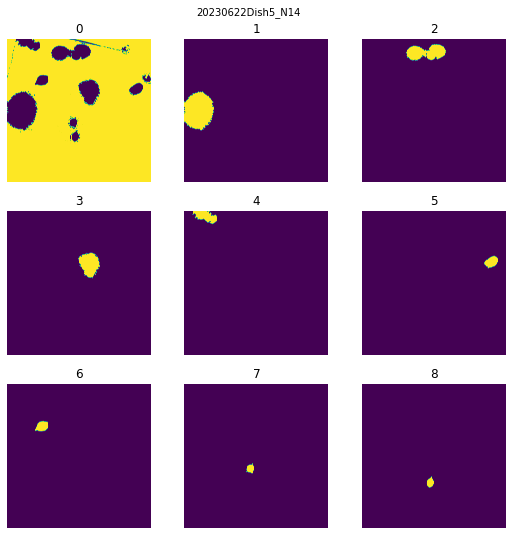

In [145]:
ilastik_fdn = '/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/fake_RGB_images/picked_figures/'
cell_anno_fdn = '/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/fake_RGB_images/cell_annotation/picked/'

for fn in [i for i in os.listdir(ilastik_fdn) if '.tiff' in i]:
    seg, labeled = cell_labels(os.path.join(ilastik_fdn, fn))
    name = fn.replace('_Simple Segmentation.tiff', '')
    # plot the first few sgemented cells
    
    # get the pixel intensity of lablled area according to area
    # i.e., the first area is background,the second area is the largest cell
    pxs = np.bincount(labeled.ravel()).argsort()[::-1]
    
    fig, axs = plt.subplots(3, 3, figsize=[9, 9], sharex=True, sharey=True)
    axs = axs.ravel()

    for i, px in enumerate(pxs[:9]): # background & first 8 cells
        axs[i].imshow(labeled == px)
        axs[i].set_title(i)
        axs[i].axis('off')

    fig.text(0.5, 0.92, name, va='center', ha='center')

    fig.savefig(os.path.join(cell_anno_fdn, name + '.png'), dpi=150) 

import segmentated figure
get labels of each cell


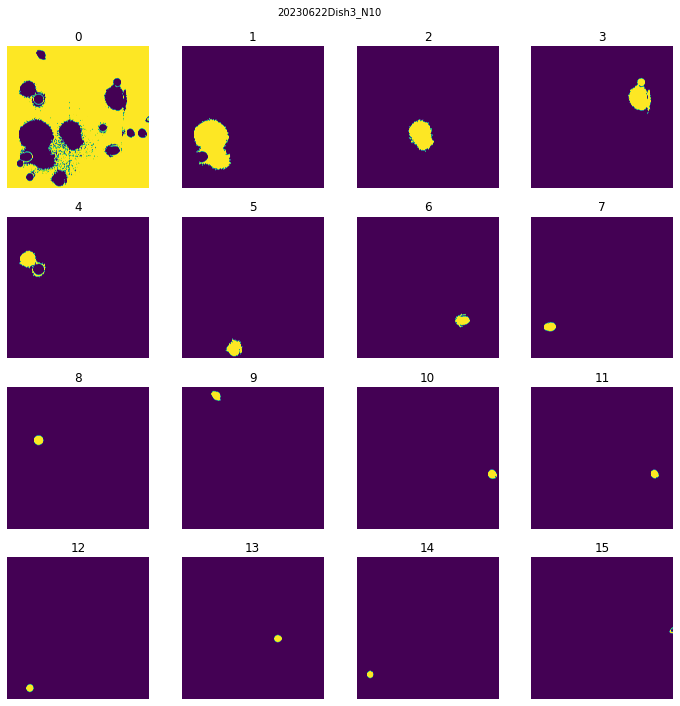

In [176]:
ilastik_fdn = '/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/fake_RGB_images/picked_figures/'
cell_anno_fdn = '/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/fake_RGB_images/cell_annotation/picked/'

for fn in ['20230620Dish4_G13_Simple Segmentation.tiff',
           '20230621Dish2_K12_Simple Segmentation.tiff',
           '20230622Dish2_J2_Simple Segmentation.tiff',
           '20230622Dish3_M9_Simple Segmentation.tiff',
           '20230622Dish3_N10_Simple Segmentation.tiff']: 
    # '20230622Dish3_N10_Simple Segmentation.tiff': 16 panels
    seg, labeled = cell_labels(os.path.join(ilastik_fdn, fn))
    name = fn.replace('_Simple Segmentation.tiff', '')
    # plot the first few sgemented cells
    
    # get the pixel intensity of lablled area according to area
    # i.e., the first area is background,the second area is the largest cell
    pxs = np.bincount(labeled.ravel()).argsort()[::-1]
    
    fig, axs = plt.subplots(4, 3, figsize=[9, 12], sharex=True, sharey=True)
    axs = axs.ravel()

    for i, px in enumerate(pxs[:16]): # background & first 8 cells
        axs[i].imshow(labeled == px)
        axs[i].set_title(i)
        axs[i].axis('off')

    fig.text(0.5, 0.92, name, va='center', ha='center')

    fig.savefig(os.path.join(cell_anno_fdn, name + '.png'), dpi=150)

### create a cell annotation table

In [161]:
import string
listAlphabet = list(string.ascii_uppercase)

idx = []
for i in range(3, 13):
    for j in range(2,14):
        a = listAlphabet[j]
        idx.append(a + str(i))
        
df = pd.DataFrame(index=idx)
df['Batch'] = ['20230620'] * 36 +  ['20230621'] * 36 + ['20230622'] * 48

df.to_csv('/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/fake_RGB_images/cell_annotation/cell_annotation.tsv', 
          sep='\t')

### crop single cell npzs

In [24]:
df = pd.read_csv('/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/fake_RGB_images/cell_annotation/cell_annotation.tsv', 
          sep='\t', index_col=0)

figure_npz_fdn = '/home/yike/phd/cancer_cells_img_seq/data/202306_imaging/'
ilastik_seg = '/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/fake_RGB_images/picked_figures/'
cropped_fdn = '/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/cropped_cell_npz/'
sig_cell_images = '/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/single_cell_images'

In [16]:
sig_df = df[df['Cell_number'] == 1]
sig_df['Mask'] = sig_df['Batch'].astype(str) + sig_df['Grid']
ncells = len(df[df['Cell_number'] == 1].index)

i = 0
for grid in sig_df['Mask'].unique():
    print('loading...')
    raw = np.load(figure_npz_fdn + grid[:8] + '_imaging/' + grid[8:] + '.npz')
    _, labeled = cell_labels(os.path.join(ilastik_seg, grid + '_Simple Segmentation.tiff'))
    pxs = np.bincount(labeled.ravel()).argsort()[::-1]
    
    for cell, row in sig_df[sig_df['Mask'] == grid].iterrows():
        antt = int(row['Cell_annotation'])
        print(f'{cell}: {i+1}/{ncells}')

        if cell in ['F3', 'F7']:
            margin_px = 250
        elif cell in ['M3', 'F8']:
            margin_px = 150
        elif cell in ['G9', 'H7', 'K5', 'J4', 'J5', 'J9']:
            margin_px = 100
        else:
            margin_px = 80
        
        print('find ROI...')
        seg = (labeled == pxs[antt])
        
        i0s = seg.any(axis=1).nonzero()[0]
        i1s = seg.any(axis=0).nonzero()[0]
        i00, i01 = i0s[0], i0s[-1] + 1
        i10, i11 = i1s[0], i1s[-1] + 1

        print('add margins...')
        i00 = max(0, i00 - margin_px)
        i10 = max(0, i10 - margin_px)
        i01 = min(seg.shape[0], i01 + margin_px)
        i11 = min(seg.shape[1], i11 + margin_px)

        print('crop...')
        img_dict = {}
        for key, val in raw.items():
            img_dict[key] = val[i00: i01, i10: i11]
        
        img_dict['segmentation'] = seg[i00: i01, i10: i11]

        print('save to file...')
        np.savez_compressed(os.path.join(cropped_fdn, cell + '.npz'), **img_dict)

        print('done')

loading...
import segmentated figure
get labels of each cell
H4: 2/81
find ROI...
add margins...
crop...
save to file...
done


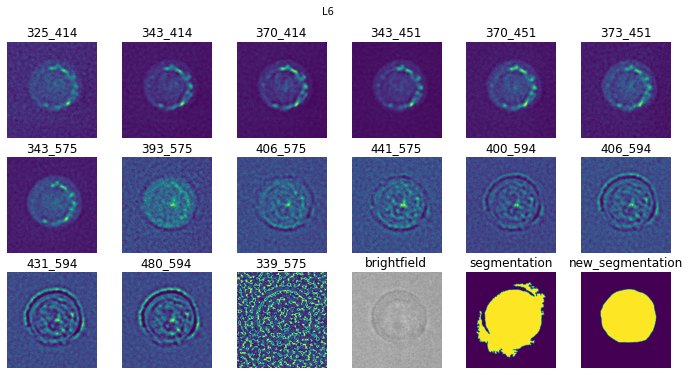

In [25]:
sig_cell_images = '/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/single_cell_images'

# for fn in [i for i in os.listdir(cropped_fdn) if '.npz' in i]:
for fn in ['L6.npz']:
    img_dict = np.load(os.path.join(cropped_fdn, fn))
    cell = fn.split('.')[0]
    
    fig, axs = plt.subplots(3, 6, figsize=[12, 6], sharex=True, sharey=True)
    axs = axs.ravel()

    for i, key in enumerate(img_dict.files):
        axs[i].imshow(img_dict[key])
        axs[i].axis('off')
        axs[i].set_title((key, key[4:])['wls' in key])
    
    fig.text(0.5, 0.95, cell, va='center', ha='center')
    
    fig.savefig(os.path.join(sig_cell_images, cell + '.png'), dpi=100, bbox_inches='tight')

<ipython-input-32-3ad9012be962>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(4, 4, figsize=[8, 8], sharex=True, sharey=True)


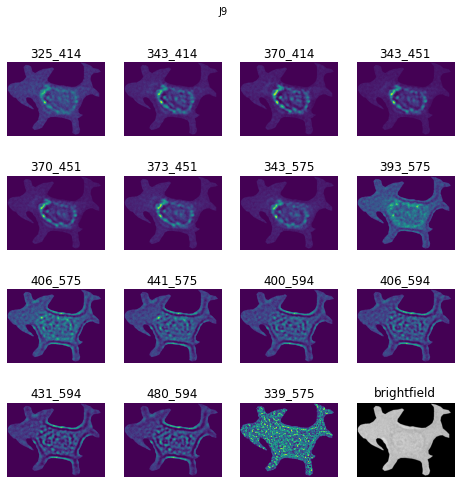

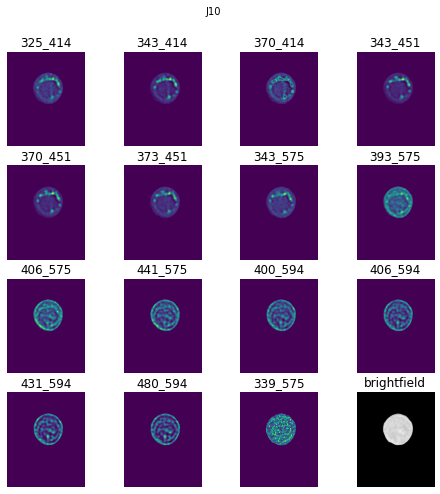

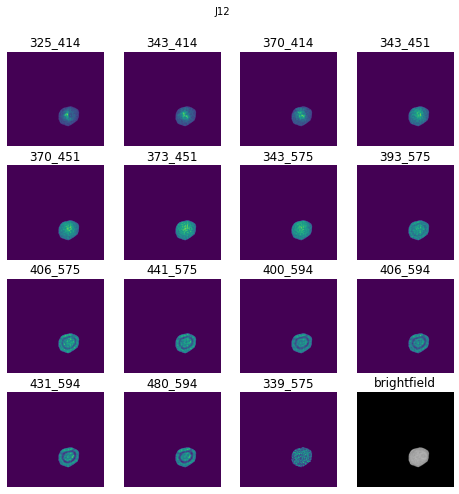

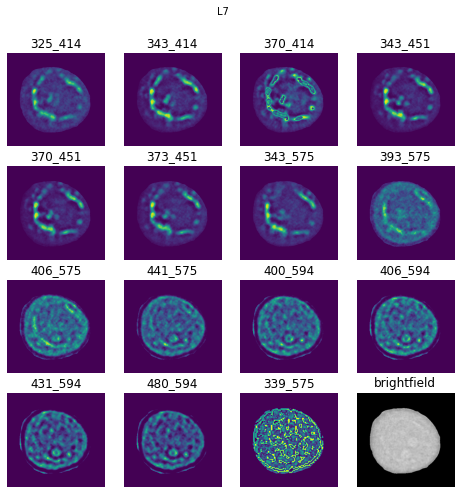

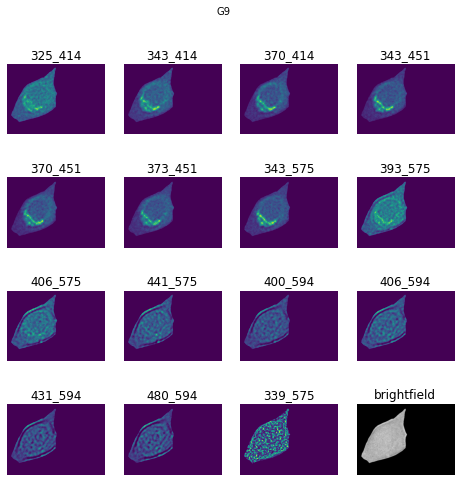

...

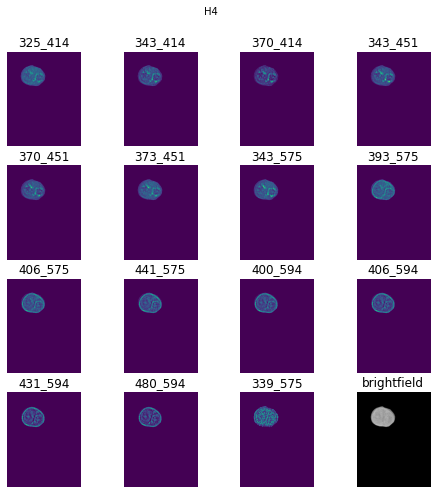

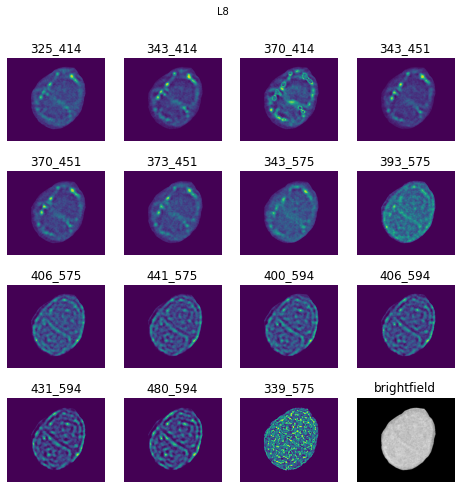

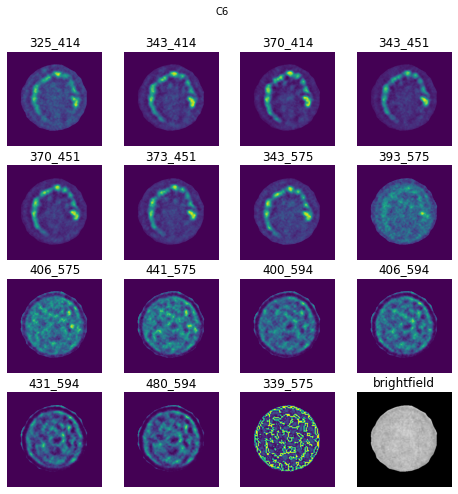

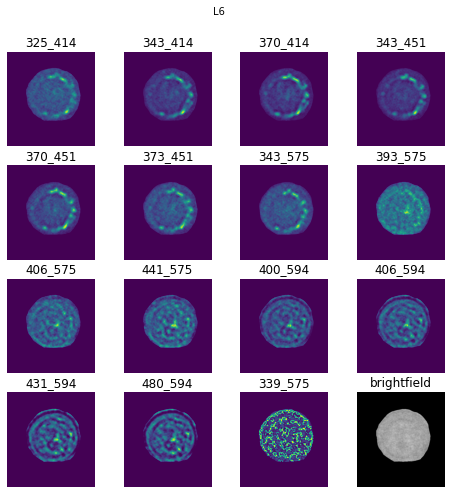

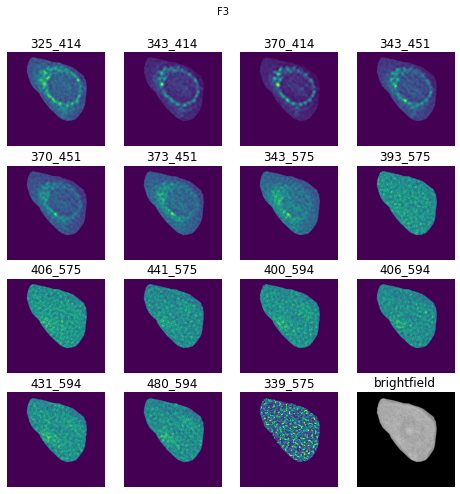

In [32]:
sig_seg_images = '/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/sigle_cell_segmented_images'

for fn in [i for i in os.listdir(cropped_fdn) if '.npz' in i]:

    img_dict = np.load(os.path.join(cropped_fdn, fn))
    cell = fn.split('.')[0]
    
    fig, axs = plt.subplots(4, 4, figsize=[8, 8], sharex=True, sharey=True)
    axs = axs.ravel()

    for i, key in enumerate(img_dict.files[:16]):
        if i < 15:
            axs[i].imshow(img_dict[key] * img_dict['new_segmentation'])
        else:
            reshape = img_dict['new_segmentation'].reshape(img_dict[key].shape[0], img_dict[key].shape[1], 1)
            axs[i].imshow(img_dict[key] * reshape)
            
        axs[i].axis('off')    
        axs[i].set_title((key, key[4:])['wls' in key])
    
    fig.text(0.5, 0.95, cell, va='center', ha='center')
    
    fig.savefig(os.path.join(sig_seg_images , cell + '.png'), dpi=100, bbox_inches='tight')

In [8]:
# 94 single cells in batch 1 

sig_cell_images = '/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/single_cell_images/good/'
sig_seg_images = '/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/sigle_cell_segmented_images/good/'
cropped_fdn = '/home/yike/phd/cancer_cells_img_seq/figures/batch_202306/cropped_cell_npz/good/'

for fn in [i for i in os.listdir(cropped_fdn) if ('.npz' in i)]:

    img_dict = np.load(os.path.join(cropped_fdn, fn))
    cell = fn.split('.')[0]
#     new_keys = img_dict.files[1:16] + img_dict.files[-1:] + img_dict.files[:1] + img_dict.files[-2:-1]
    new_keys = img_dict.files
    
    ######## single cells
    fig, axs = plt.subplots(3, 6, figsize=[12, 6], sharex=True, sharey=True)
    axs = axs.ravel()

    for i, key in enumerate(new_keys):
        axs[i].imshow(img_dict[key])
        axs[i].axis('off')
        axs[i].set_title((key, key[4:])[
            'wls' in key])
    
    fig.text(0.5, 0.95, cell, va='center', ha='center')
    fig.savefig(os.path.join(sig_cell_images, cell + '.png'), dpi=100, bbox_inches='tight')
    plt.close()
    
    ######## segmented cells
    fig, axs = plt.subplots(4, 4, figsize=[8, 8], sharex=True, sharey=True)
    axs = axs.ravel()

    for i, key in enumerate(new_keys[:16]):
        if i < 15:
            axs[i].imshow(img_dict[key] * img_dict['new_segmentation'])
        else:
            reshape = img_dict['new_segmentation'].reshape(img_dict[key].shape[0], img_dict[key].shape[1], 1)
            axs[i].imshow(img_dict[key] * reshape)
            
        axs[i].axis('off')    
        axs[i].set_title((key, key[4:])['wls' in key])
    
    fig.text(0.5, 0.95, cell, va='center', ha='center')
    fig.savefig(os.path.join(sig_seg_images, cell + '.png'), dpi=100, bbox_inches='tight')
    plt.close()